# Audio Processing and Audio Features 

In [1]:
%matplotlib inline

import librosa
import librosa.display
import warnings

from IPython.display import Audio
import json
import requests
import os
from collections import defaultdict

import importlib

import sklearn
import numpy as np

import pandas as pd
from sklearn.svm import LinearSVC

from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification

from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier

import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix

import glob
import csv

from keras.models import Sequential
from keras.layers import Dense, Activation
from keras.utils.np_utils import to_categorical
#! pip install --user keras

Using TensorFlow backend.


In [2]:
def folderNames(cat):
    path = 'test-music-data/' + str(cat) + '/'
    dir_list = [directory for directory in os.listdir(path) if os.path.isdir(path+directory)]
    return dir_list

def getPaths(folders, cat):
    li = []
    for folder in folders:
        path = 'test-music-data/' + str(cat) + '/' + str(folder)
        files = [f for f in glob.glob(path + "/*.mp4", recursive=True)]
        for f in files:
            li.append(f)
    return li

In [3]:
bay_area_files = getPaths(folderNames('bay_area'), 'bay_area')
chinese_files = getPaths(folderNames('chinese'), 'chinese')

In [4]:
%%capture [--no-stderr]

def getDf(filePaths, outname):
    
    dic = defaultdict(list)
    for audioFile in filePaths:
        
        if audioFile in chinese_files:
            label = "China"
        else:
            label = "Bay_Area"

        y, sr = librosa.load(audioFile)
        chroma_stft = librosa.feature.chroma_stft(y=y, sr=sr)
        spec_cent = librosa.feature.spectral_centroid(y=y, sr=sr)
        spec_bw = librosa.feature.spectral_bandwidth(y=y, sr=sr)
        rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr)
        zcr = librosa.feature.zero_crossing_rate(y)
        mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=12)
        
        
        dic['chroma_stft'].append(np.mean(chroma_stft))
        dic['spec_cent'].append(np.mean(spec_cent))
        dic['spec_bw'].append(np.mean(spec_bw))
        dic['rolloff'].append(np.mean(rolloff))
        dic['zcr'].append(np.mean(zcr))
        
        count = 0
        for i in mfcc:
            key = 'mfcc_' + str(count)
            dic[key].append(np.mean(i))
            count += 1
            
        dic['song_name'].append(audioFile)
        dic['label'].append(label)
        
    df = pd.DataFrame.from_dict(dic) 
    df.to_csv(outname)
    
    return df
    
    
def getDfChroma(filePaths, outname):
    
    dic = defaultdict(list)
    
    for audioFile in filePaths:
        y, sr = librosa.load(audioFile)
        data = librosa.feature.chroma_stft(y=y, sr=sr)
        
        for li in data:
            
            dic['C'].append(li[0])
            dic['C#'].append(li[1])
            dic['D'].append(li[2])
            dic['D#'].append(li[3])
            dic['E'].append(li[4])
            dic['F'].append(li[5])
            dic['F#'].append(li[6])
            dic['G'].append(li[7])
            dic['G#'].append(li[8])
            dic['A'].append(li[9])
            dic['A#'].append(li[10])
            dic['B'].append(li[11])
    
    df = pd.DataFrame.from_dict(dic) 
    df.to_csv(outname)
    
    return df

In [ ]:
%%capture [--no-stderr]
df_bay = getDf(bay_area_files, 'Bay_Area_AudioFeat.csv')

In [13]:
%%capture [--no-stderr]
df_china = getDf(chinese_files, 'China_AudioFeat.csv')

In [5]:
bay_df = pd.read_csv('Bay_Area_AudioFeat.csv')
china_df2 = pd.read_csv('China_AudioFeat.csv')
china_df2 = china_df2.iloc[:509]
df = pd.concat([bay_df, china_df2], ignore_index=True)
df = df.drop(['Unnamed: 0'], axis=1)
df_feat = df[['mfcc_0', 'mfcc_1', 'mfcc_2', 'mfcc_3', 'mfcc_4', 'mfcc_5', 'mfcc_6', 'mfcc_7', 'mfcc_8', 'mfcc_9', 'mfcc_10', 'mfcc_11']]
df['variation'] = df_feat.var(axis=1)
df
#'chroma_stft', 'spec_cent', 'spec_bw', 'rolloff', 'zcr', 

,chroma_stft,spec_cent,spec_bw,rolloff,zcr,mfcc_0,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,mfcc_8,mfcc_9,mfcc_10,mfcc_11,song_name,label,variation
0,0.485976,2002.351904,2451.726589,4614.772095,0.067467,-157.644104,110.661789,15.310498,18.213867,4.571348,17.535770,-6.693285,7.790489,-1.818633,2.555727,6.080895,8.211170,test-music-data/bay_area/Mousie/Streetlife.mp4,Bay_Area,3469.166468
1,0.466990,3496.172812,2797.017402,6777.550684,0.174507,-53.983871,29.088737,10.675389,34.739033,2.846711,12.832184,-4.567713,13.181125,2.101285,14.274426,-2.286026,7.141497,test-music-data/bay_area/Mousie/Romped Out Nor...,Bay_Area,486.316633
2,0.408249,2970.134202,2704.486884,6277.037044,0.130153,-28.759863,64.046333,-2.173676,14.144640,-7.254954,5.900651,-5.331407,11.964459,-9.363317,10.518526,-1.805275,7.854172,test-music-data/bay_area/Mousie/I Never.mp4,Bay_Area,487.157463
3,0.549053,2598.878503,2803.739409,5915.589229,0.101321,-153.302231,76.432640,29.580839,28.815849,8.020270,16.927233,-3.622349,14.298937,2.047995,1.624954,3.888669,5.406909,test-music-data/bay_area/Mousie/Gettin' Paid.mp4,Bay_Area,2872.084546
4,0.520543,3530.049518,3001.907608,7099.057073,0.165663,-24.940088,52.508392,21.944202,8.560086,2.684887,14.272845,-16.360476,7.680749,-8.213431,1.421366,-4.248354,6.634094,test-music-data/bay_area/Mousie/Moving Vicious...,Bay_Area,389.393351
5,0.484276,2177.240801,2481.117150,4841.920722,0.078164,-80.182076,99.910118,6.631776,16.769331,17.106558,15.756921,-9.569978,6.186160,0.064141,6.827749,2.371093,7.775260,test-music-data/bay_area/Mousie/Big Bad Norte.mp4,Bay_Area,1531.830782
6,0.573286,1688.878106,2406.716220,3852.226706,0.035801,-201.262604,120.667435,37.210426,15.048691,14.209770,13.938295,-1.604790,15.081520,3.651073,6.367499,5.385603,10.642880,test-music-data/bay_area/Mousie/No Regrets.mp4,Bay_Area,5215.615868
7,0.464852,2483.245869,2608.265889,5338.767717,0.081264,-91.835945,73.253906,20.264524,40.733192,14.822311,14.905104,-4.473976,12.964441,5.685937,2.700000,-4.392012,8.497668,test-music-data/bay_area/Mousie/Northside Sold...,Bay_Area,1446.200419
8,0.460275,2886.866691,2952.229055,6563.643644,0.105900,-37.503944,76.197060,22.298540,9.462629,7.114221,11.113377,-12.100894,8.887393,-3.293526,2.647958,-0.306928,4.518746,test-music-data/bay_area/Mousie/Northside Sold...,Bay_Area,688.783253
9,0.336787,2154.144116,2411.399372,4637.713623,0.089202,-63.226120,114.441978,16.397787,10.992660,-6.945590,14.163013,-3.290092,10.319881,-4.388152,8.598323,2.980294,6.196734,test-music-data/bay_area/Mousie/Forever In My ...,Bay_Area,1550.024486


In [3]:
%%capture [--no-stderr]
df_bay_feat = bay_df[['mfcc_0', 'mfcc_1', 'mfcc_2', 'mfcc_3', 'mfcc_4', 'mfcc_5', 'mfcc_6', 'mfcc_7', 'mfcc_8', 'mfcc_9', 'mfcc_10', 'mfcc_11']]
df_china_feat = china_df2[['mfcc_0', 'mfcc_1', 'mfcc_2', 'mfcc_3', 'mfcc_4', 'mfcc_5', 'mfcc_6', 'mfcc_7', 'mfcc_8', 'mfcc_9', 'mfcc_10', 'mfcc_11']]
bay_df['variation'] = df_bay_feat.var(axis=1)
china_df2['variation'] = df_china_feat.var(axis=1)

#'chroma_stft', 'spec_cent', 'spec_bw', 'rolloff', 'zcr', 

Find the songs in each catagory with the most (95th percentile), least (5th percentile), and median (50th percentile) variation accross all the features selected. We will use 3 songs from each catagory and analyse these features more closely on the full audio file of the spotify preview of the song

In [4]:
china_df2 = china_df2.sort_values(by=['variation'])
bay_df = bay_df.sort_values(by=['variation'])
bay_df = bay_df.drop(['Unnamed: 0'], axis=1)
china_df2 = china_df2.drop(['Unnamed: 0'], axis=1)

In [7]:
print('Highest Variation in Bay Area songs\n')
print(bay_df['variation'].head())
print('\n---------------------------------\n')
print('Lowest Variation in Bay Area songs\n')
print(bay_df['variation'].tail())

Highest Variation in Bay Area songs

238    213.717560
320    214.426526
343    235.389595
191    292.623831
128    292.623831
Name: variation, dtype: float64

---------------------------------

Lowest Variation in Bay Area songs

367    4006.320194
481    4088.599707
341    4526.969727
319    4874.537672
6      5215.615868
Name: variation, dtype: float64


In [8]:
print('Highest Variation in Chinese songs\n')
print(china_df2['variation'].head())
print('\n---------------------------------\n')
print('Lowest Variation in Chinese songs\n')
print(china_df2['variation'].tail())

Highest Variation in Chinese songs

144    141.286934
335    221.241854
141    221.439976
147    222.395933
170    223.231088
Name: variation, dtype: float64

---------------------------------

Lowest Variation in Chinese songs

321    3227.348618
113    3273.546984
52     4581.946413
222    4732.114801
45     5926.788531
Name: variation, dtype: float64


In [10]:
#95th percentile (most)
most_var_idx = 25

#50th percentile (median)
median_var_idx = 253

#5th percentile (least)
least_var_idx = 483

In [11]:
song_bay_high = bay_df.iloc[[most_var_idx]]['song_name']
song_bay_median = bay_df.iloc[[median_var_idx]]['song_name']
song_bay_low = bay_df.iloc[[least_var_idx]]['song_name']

song_china_high = china_df2.iloc[[most_var_idx]]['song_name']
song_china_median = china_df2.iloc[[median_var_idx]]['song_name']
song_china_low = china_df2.iloc[[least_var_idx]]['song_name']

#Song locations with artist and song information
song_bay_high_path = 'test-music-data/bay_area/Lil Rue/Goon.mp4'
song_bay_median_path = 'test-music-data/bay_area/Lil Dee/In My Hood.mp4'
song_bay_low_path = 'test-music-data/bay_area/DarkRoom Familia/I\'m a Gunner.mp4'
song_china_high_path = 'test-music-data/chinese/RPG/隻手遮天.mp4'
song_china_meidan_path = 'test-music-data/chinese/黃旭/Know My Style (feat. 艾福傑尼 & 黃旭) - Gizzle Remix.mp4'
song_china_low_path = 'test-music-data/chinese/王以太/Life Is Beautiful.mp4'

# Spotify Audio Preview (Load mp4, EDA, Feature Creation)

Library Fuctions for graphs and features

In [13]:
def createWaveform(y, sr, title):
    plt.figure(figsize=(12,6))
    librosa.display.waveplot(y, sr=sr)
    plt.title(title, fontsize=16)
    plt.tight_layout()
    plt.ylabel("Amplitude", fontsize=16)
    plt.show()

In [14]:
def createMelSpec(y, sr, title):
    S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128)
    plt.figure(figsize=(14, 5))
    S_dB = librosa.power_to_db(abs(S))
    librosa.display.specshow(S_dB, x_axis='time', y_axis='mel', sr=sr)
    plt.colorbar(format='%+2.0f dB')
    plt.title('Mel-frequency Spectrogram of ' + title, fontsize=15)
    plt.tight_layout()
    plt.show()

In [15]:
def createChroma(y, sr, title):
    plt.figure()
    C = librosa.feature.chroma_stft(y=y, sr=sr)
    tempo, beat_f = librosa.beat.beat_track(y=y, sr=sr, trim=False)
    beat_f = librosa.util.fix_frames(beat_f, x_max=C.shape[1])
    Csync = librosa.util.sync(C, beat_f, aggregate=np.median)
    beat_t = librosa.frames_to_time(beat_f, sr=sr)
    plt.figure(figsize=(14, 5))
    librosa.display.specshow(Csync, y_axis='chroma', x_axis='time', x_coords=beat_t)
    plt.colorbar()
    plt.title('Chroma Frequencies of ' + title + ' (Beat Time)', fontsize=15)
    plt.tight_layout()
    plt.show()

In [16]:
#Normalize for viz
def normalize(y):
    return sklearn.preprocessing.minmax_scale(y, axis=0)

def SpecCentroid(y, sr, title):
    spectral_centroids = librosa.feature.spectral_centroid(y, sr=sr)[0]
    spectral_centroids.shape
    frames = range(len(spectral_centroids))
    t = librosa.frames_to_time(frames)
    plt.figure(figsize=(14, 5))
    librosa.display.waveplot(y, sr=sr, alpha=0.4)
    plt.title('Spectral Centroid of ' + title, fontsize=15)
    plt.plot(t, normalize(spectral_centroids), color='r')
    plt.tight_layout()
    plt.show()

# Bay Area Rap Waveforms

In [18]:
%%capture [--no-stderr]
yHigh, srHigh = librosa.load(song_bay_high_path)
yMid, srMid = librosa.load(song_bay_median_path)
yLow, srLow = librosa.load(song_bay_low_path)

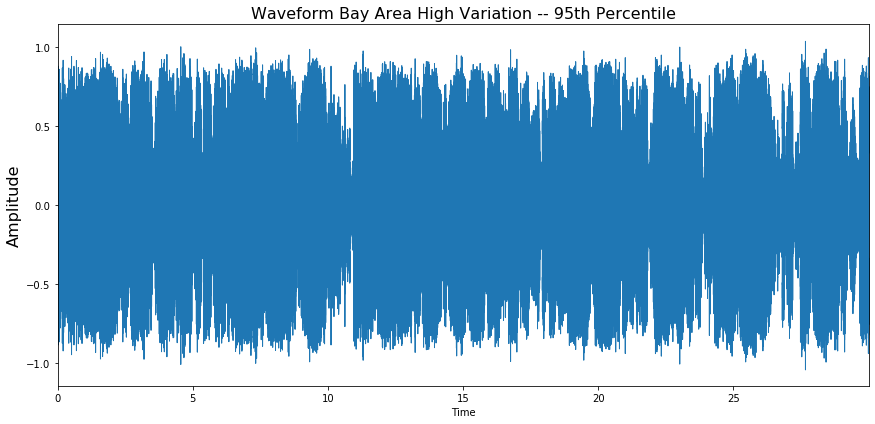

In [73]:
createWaveform(yHigh, srHigh, 'Waveform Bay Area High Variation -- 95th Percentile')
Audio(data=yHigh, rate=srHigh)

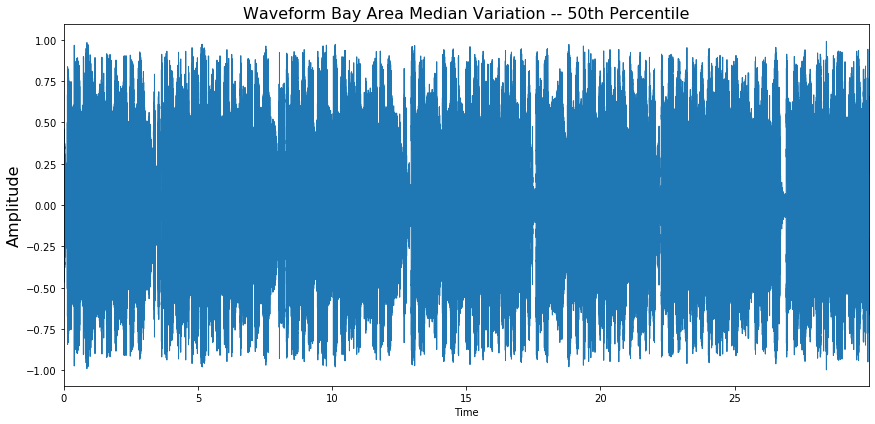

In [74]:
createWaveform(yMid, srMid, 'Waveform Bay Area Median Variation -- 50th Percentile')
Audio(data=yMid, rate=srMid)

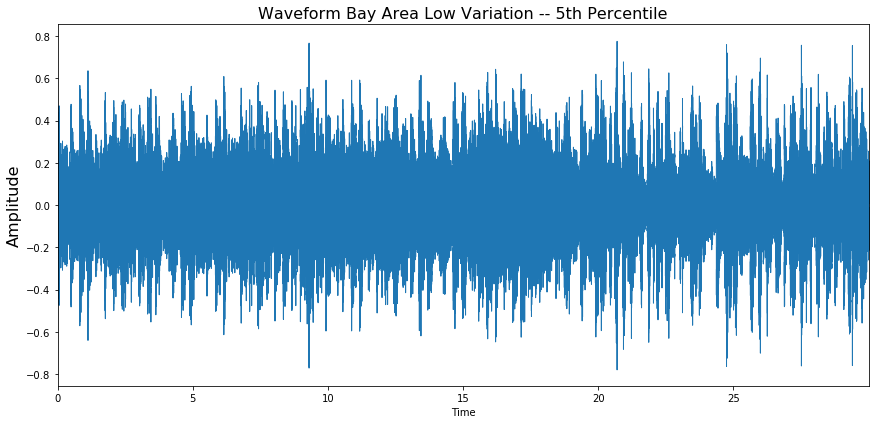

In [75]:
createWaveform(yLow, srLow, 'Waveform Bay Area Low Variation -- 5th Percentile')
Audio(data=yLow, rate=srLow)

# Chinese Rap Waveforms

In [19]:
%%capture [--no-stderr]
yHighC, srHighC = librosa.load(song_china_high_path)
yMidC, srMidC = librosa.load(song_china_meidan_path)
yLowC, srLowC = librosa.load(song_china_low_path)

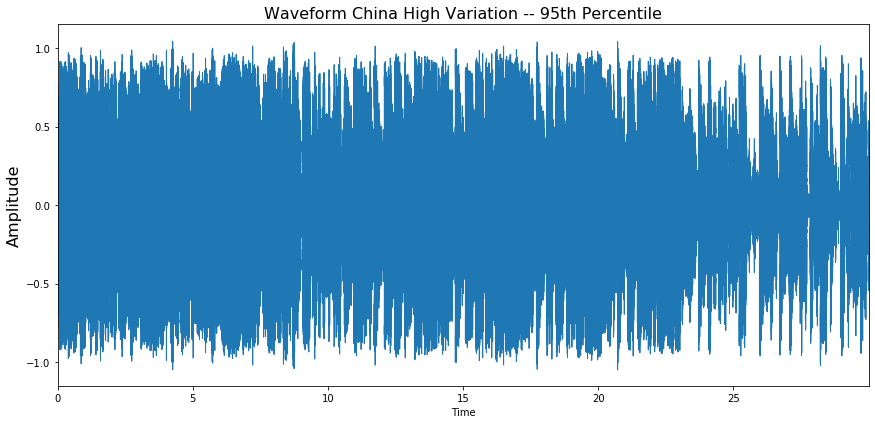

In [76]:
createWaveform(yHighC, srHighC, 'Waveform China High Variation -- 95th Percentile')
Audio(data=yHighC, rate=srHighC)

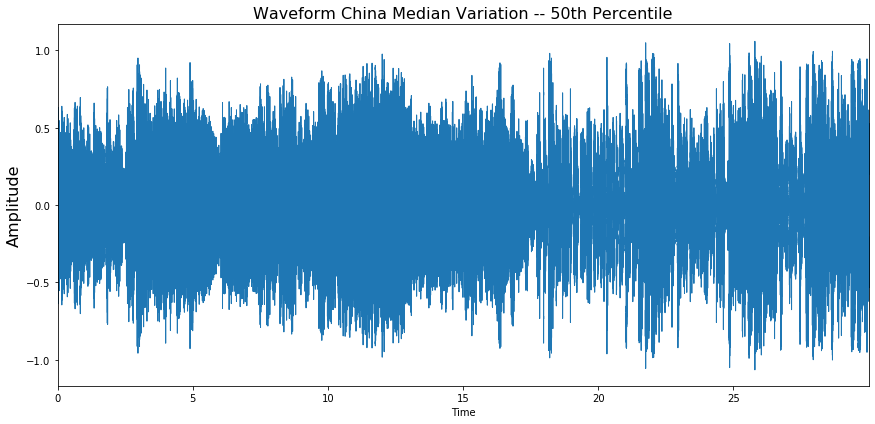

In [77]:
createWaveform(yMidC, srMidC, 'Waveform China Median Variation -- 50th Percentile')
Audio(data=yMidC, rate=srMidC)

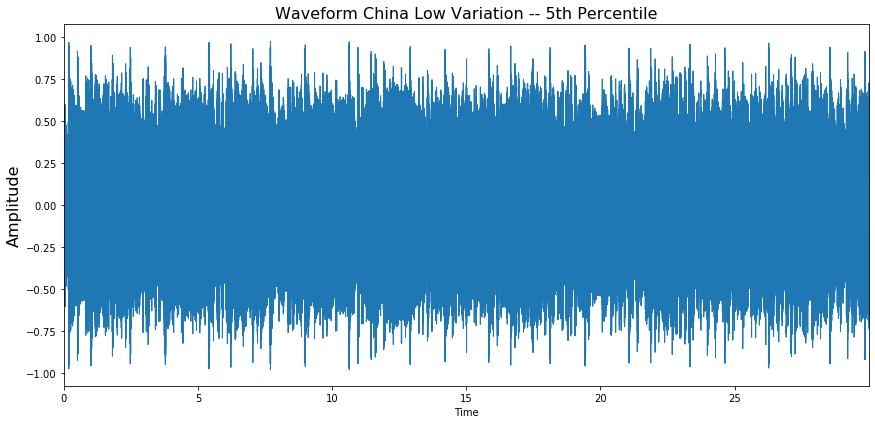

In [78]:
createWaveform(yLowC, srLowC, 'Waveform China Low Variation -- 5th Percentile')
Audio(data=yLowC, rate=srLowC)

# Mel-frequency Spectrograms of Bay Area Rap

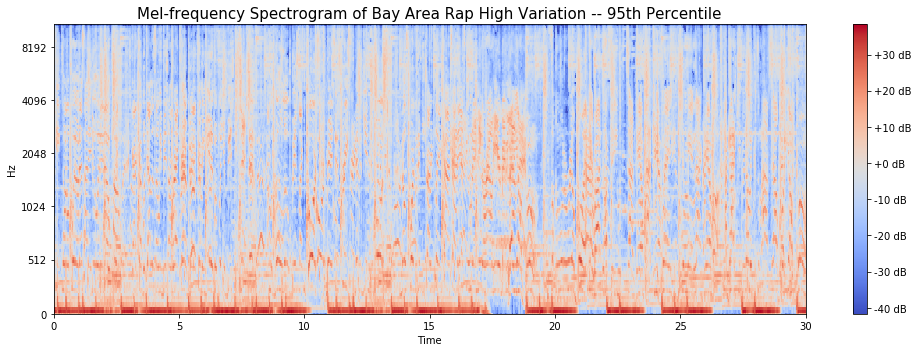

In [102]:
createMelSpec(yHigh, srHigh, 'Bay Area Rap High Variation -- 95th Percentile')

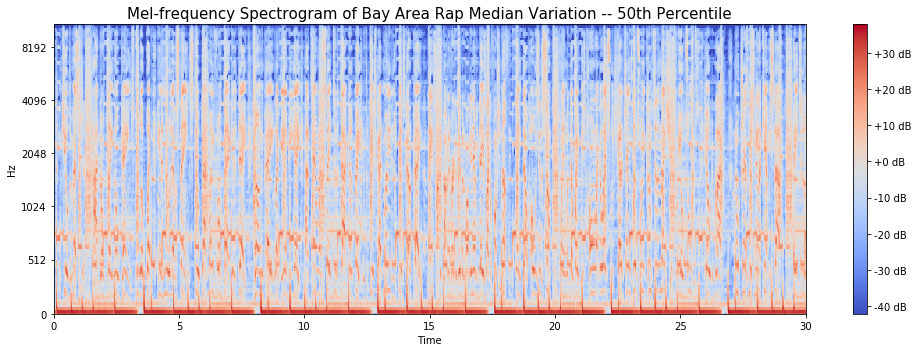

In [103]:
createMelSpec(yMid, srMid, 'Bay Area Rap Median Variation -- 50th Percentile')

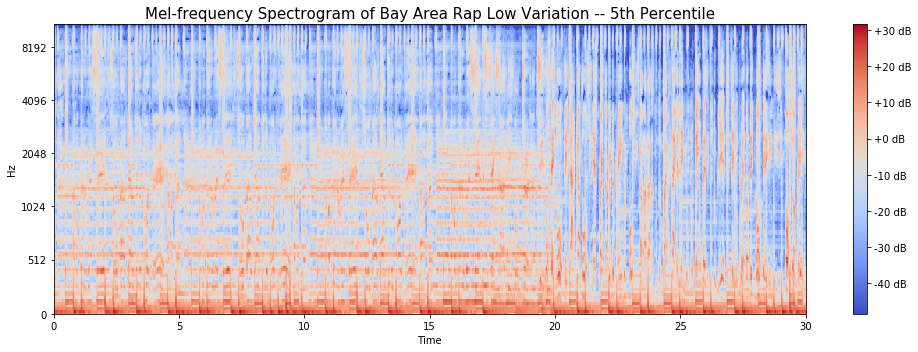

In [104]:
createMelSpec(yLow, srLow, 'Bay Area Rap Low Variation -- 5th Percentile')

# Mel-frequency Spectrograms of China Rap

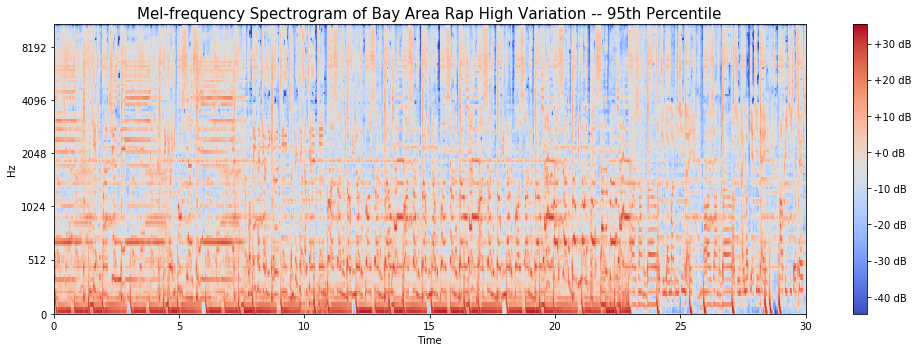

In [105]:
createMelSpec(yHighC, srHighC, 'Bay Area Rap High Variation -- 95th Percentile')

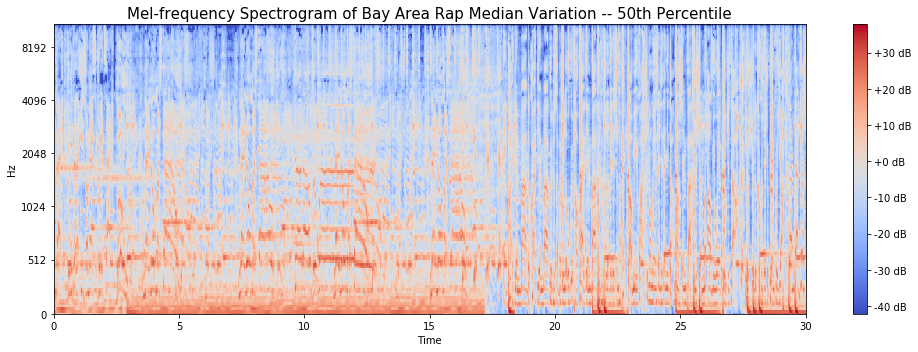

In [106]:
createMelSpec(yMidC, srMidC, 'Bay Area Rap Median Variation -- 50th Percentile')

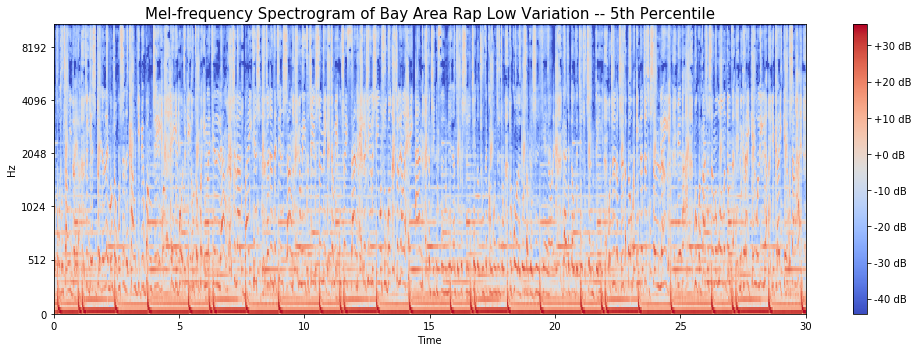

In [107]:
createMelSpec(yLowC, srLowC, 'Bay Area Rap Low Variation -- 5th Percentile')

# Spectral Centroid of Bay Area Rap

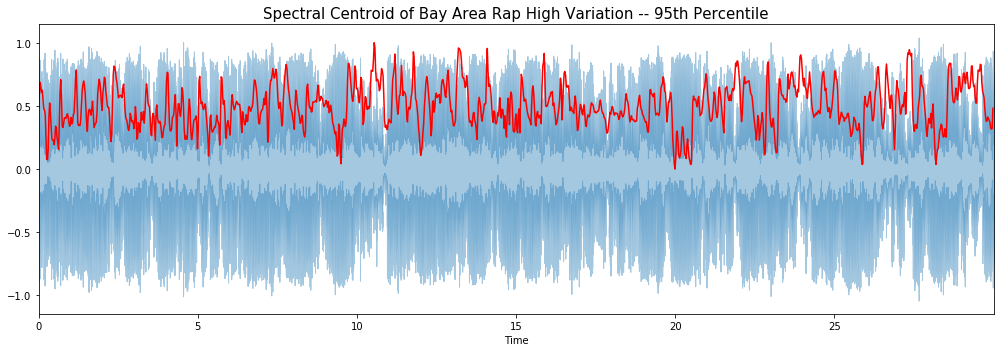

In [131]:
SpecCentroid(yHigh, srHigh, 'Bay Area Rap High Variation -- 95th Percentile')

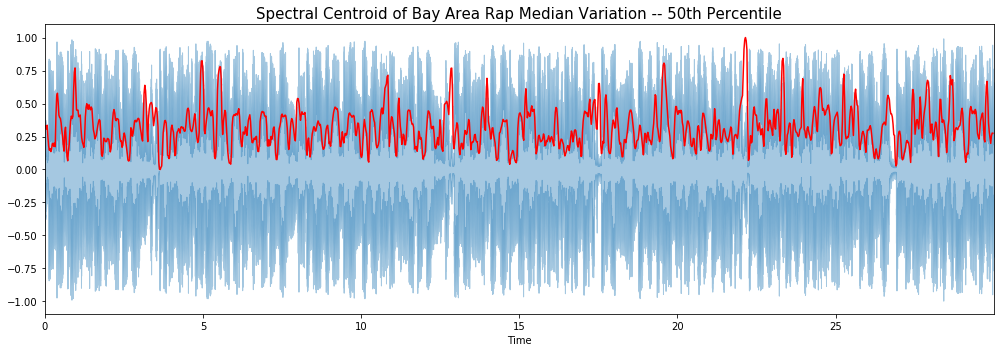

In [132]:
SpecCentroid(yMid, srMid, 'Bay Area Rap Median Variation -- 50th Percentile')

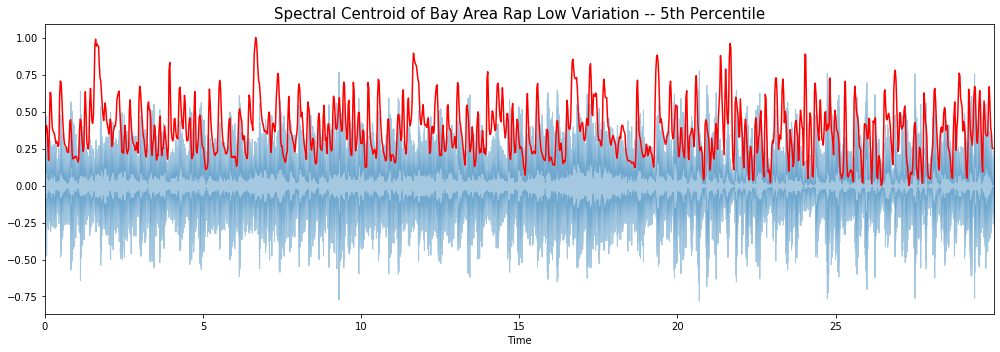

In [133]:
SpecCentroid(yLow, srLow, 'Bay Area Rap Low Variation -- 5th Percentile')

# Spectral Centroid of China Rap

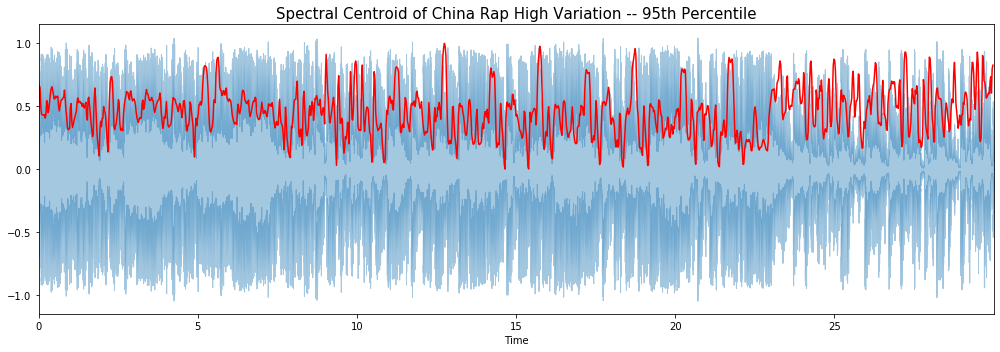

In [134]:
SpecCentroid(yHighC, srHighC, 'China Rap High Variation -- 95th Percentile')

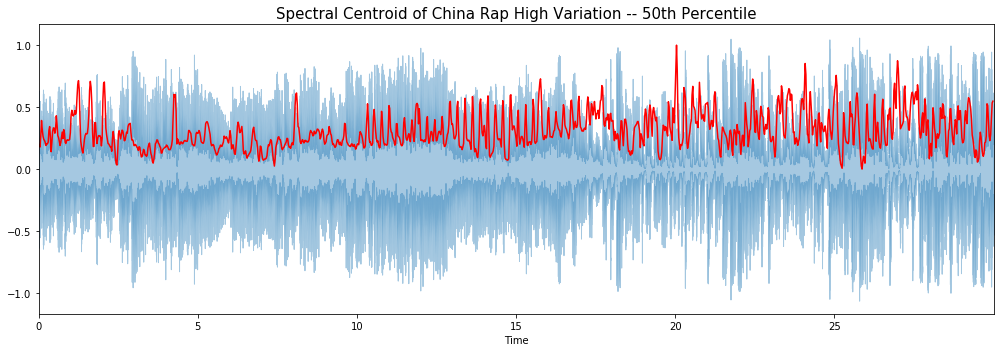

In [135]:
SpecCentroid(yMidC, srMidC, 'China Rap High Variation -- 50th Percentile')

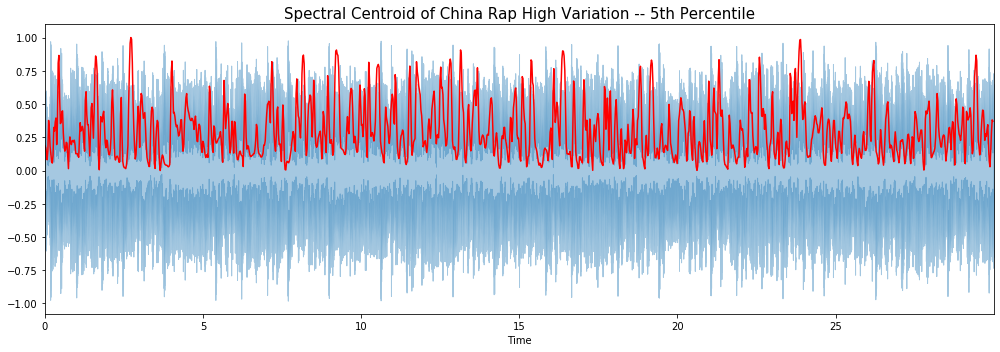

In [136]:
SpecCentroid(yLowC, srLowC, 'China Rap High Variation -- 5th Percentile')

# Chroma Frequencies of Bay Area Rap

<Figure size 432x288 with 0 Axes>

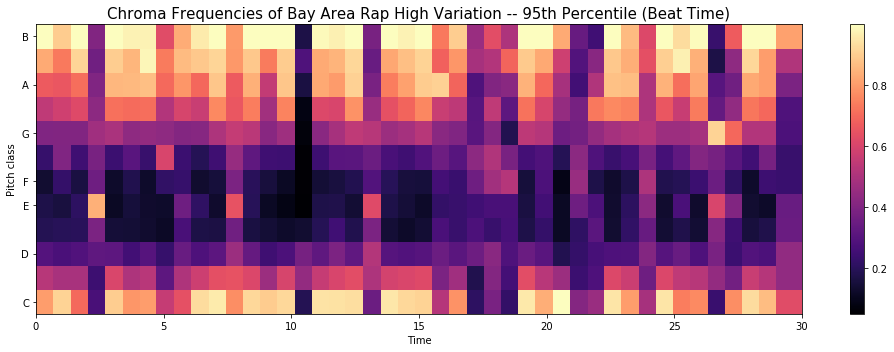

In [158]:
createChroma(yHigh, srHigh, 'Bay Area Rap High Variation -- 95th Percentile')

<Figure size 432x288 with 0 Axes>

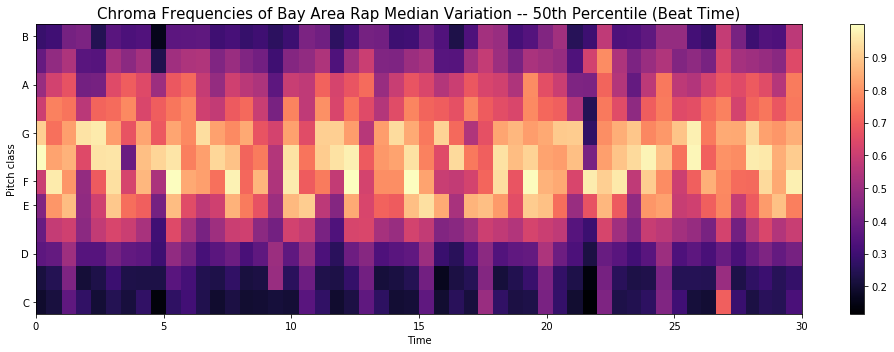

In [159]:
createChroma(yMid, srMid, 'Bay Area Rap Median Variation -- 50th Percentile')

<Figure size 432x288 with 0 Axes>

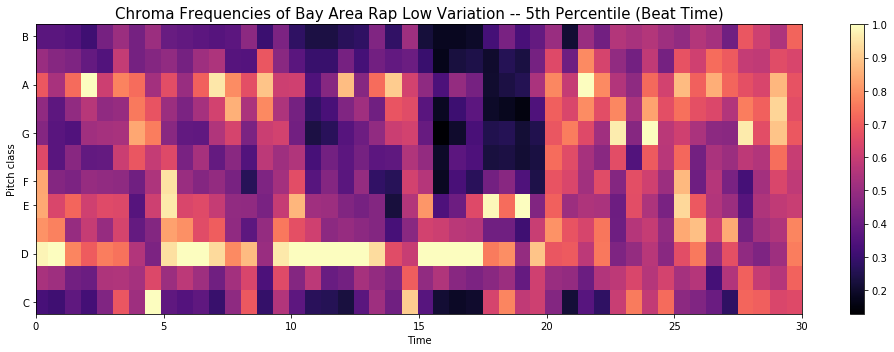

In [160]:
createChroma(yLow, srLow, 'Bay Area Rap Low Variation -- 5th Percentile')

# Chroma Frequencies of China Rap

<Figure size 432x288 with 0 Axes>

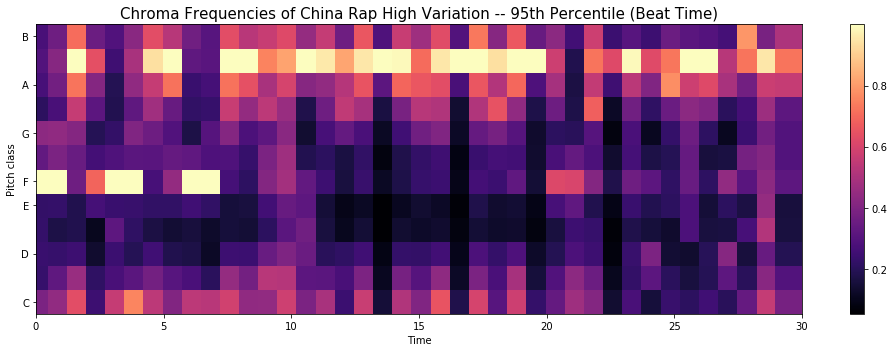

In [161]:
createChroma(yHighC, srHighC, 'China Rap High Variation -- 95th Percentile')

<Figure size 432x288 with 0 Axes>

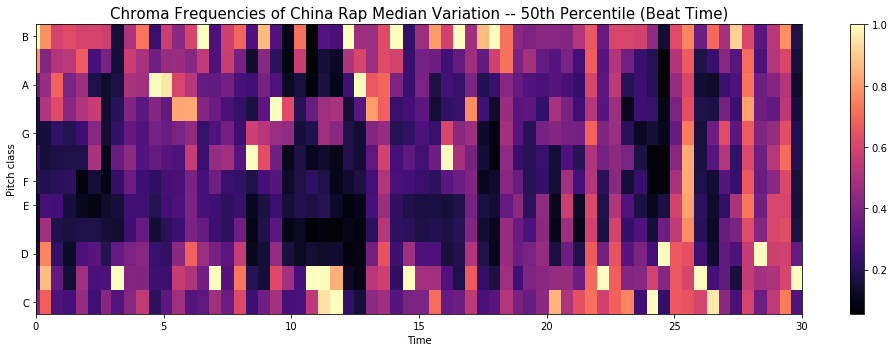

In [162]:
createChroma(yMidC, srMidC, 'China Rap Median Variation -- 50th Percentile')

<Figure size 432x288 with 0 Axes>

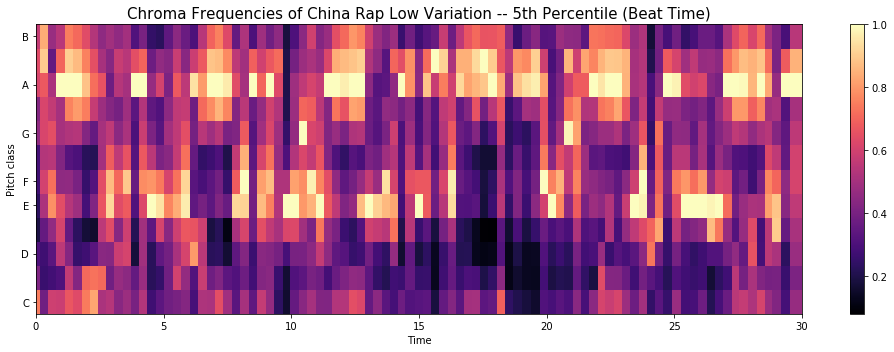

In [163]:
createChroma(yLowC, srLowC, 'China Rap Low Variation -- 5th Percentile')

# Compare Chroma Frequencies Between Bay Area and China Rap

In [ ]:
%%capture [--no-stderr]
#balance dataset to have 509 of each song
Pitch_Bay_Area = getDfChroma(bay_area_files, 'Chroma_Frequencies_Bay_Area.csv')
Pitch_China = getDfChroma(chinese_files[:509], 'Chroma_Frequencies_China.csv')

In [25]:
Bay_Area_Pitch_df = pd.read_csv('Chroma_Frequencies_Bay_Area.csv')
China_Pitch_df = pd.read_csv('Chroma_Frequencies_China.csv')

Bay_Area_Pitch_df = Bay_Area_Pitch_df.drop(['Unnamed: 0'], axis=1)
China_Pitch_df = China_Pitch_df.drop(['Unnamed: 0'], axis=1)
#Bay_Area_Pitch_df.columns = ['C_Bay', 'C#_Bay', 'D_Bay', 'D#_Bay', 'E_Bay', 'F_Bay', 'F#_Bay', 'G_Bay', 'G#_Bay', 'A_Bay', 'A#_Bay', 'B_Bay']
#China_Pitch_df.columns = ['C_China', 'C#_China', 'D_China', 'D#_China', 'E_China', 'F_China', 'F#_China', 'G_China', 'G#_China', 'A_China', 'A#_China', 'B_China']
Bay_Area_Pitch_df['label'] = 'bay_area'
China_Pitch_df['label'] = 'china'
pitch_df = pd.concat([Bay_Area_Pitch_df, China_Pitch_df], axis=0)

In [26]:
pitch_df.head()

,C,C#,D,D#,E,F,F#,G,G#,A,A#,B,label
0,0.280484,0.171261,0.233785,0.795914,0.938536,1.000000,0.993231,1.000000,1.000000,0.555417,0.488268,0.239345,bay_area
1,0.189933,0.153909,0.214763,0.560794,0.800697,0.798030,0.626719,0.472751,0.370051,0.211037,0.314666,0.244402,bay_area
2,1.000000,1.000000,1.000000,0.967299,1.000000,0.629717,0.326296,0.187720,0.280293,0.367879,0.404568,0.492408,bay_area
3,0.713749,0.729761,0.539992,0.537016,0.900213,0.543029,0.253072,0.116026,0.224969,0.522544,1.000000,1.000000,bay_area
4,0.495594,0.307197,0.155643,0.401555,0.809358,0.685074,0.495316,0.292971,0.899841,0.993419,0.768386,0.635998,bay_area


In [95]:
pitchInfo = pitch_df.groupby('label').mean().reset_index()
pitchInfo

,label,C,C#,D,D#,E,F,F#,G,G#,A,A#,B
0,bay_area,0.462404,0.461109,0.449537,0.461110,0.476036,0.496003,0.520017,0.514397,0.485427,0.465167,0.456635,0.459562
1,china,0.448365,0.445918,0.446481,0.465629,0.477821,0.483778,0.492946,0.473815,0.445885,0.431480,0.425388,0.425143


In [93]:
#Reshape df
pitchInfo_melted = pd.melt(pitchInfo, id_vars="label", var_name="semitone", value_name="value")
pitchInfo_melted.head()

,label,semitone,value
0,bay_area,C,0.404800
1,china,C,0.383295
2,bay_area,C#,0.403759
3,china,C#,0.380835
4,bay_area,D,0.392048


In [36]:
def HistOverlay(var, title, xlab, df):

    music_types = ['chinese', 'bay_area']

    for cat in music_types:

        subset = df[df['label'] == cat]

        # Draw the density plot
        sns.distplot(subset[var], hist = True, kde = False,
                     kde_kws = {'shade': True, 'linewidth': 2}, 
                      label = cat)
    fig = plt.gcf()
    fig.set_size_inches(14, 9)
    # Plot formatting
    plt.legend(prop={'size': 16}, title = 'Catagory')
    plt.title(title, fontsize=22)
    plt.xlabel(xlab, fontsize=16)
    plt.ylabel('Frequency', fontsize=16)
    
    print(df.groupby('label').describe()[var])

      label         C        C#         D        D#         E         F  \
0  bay_area  0.462404  0.461109  0.449537  0.461110  0.476036  0.496003   
1     china  0.448365  0.445918  0.446481  0.465629  0.477821  0.483778   

         F#         G        G#         A        A#         B  
0  0.520017  0.514397  0.485427  0.465167  0.456635  0.459562  
1  0.492946  0.473815  0.445885  0.431480  0.425388  0.425143  


Text(31.654583333333328, 0.5, 'Avg. Pitch Energy')

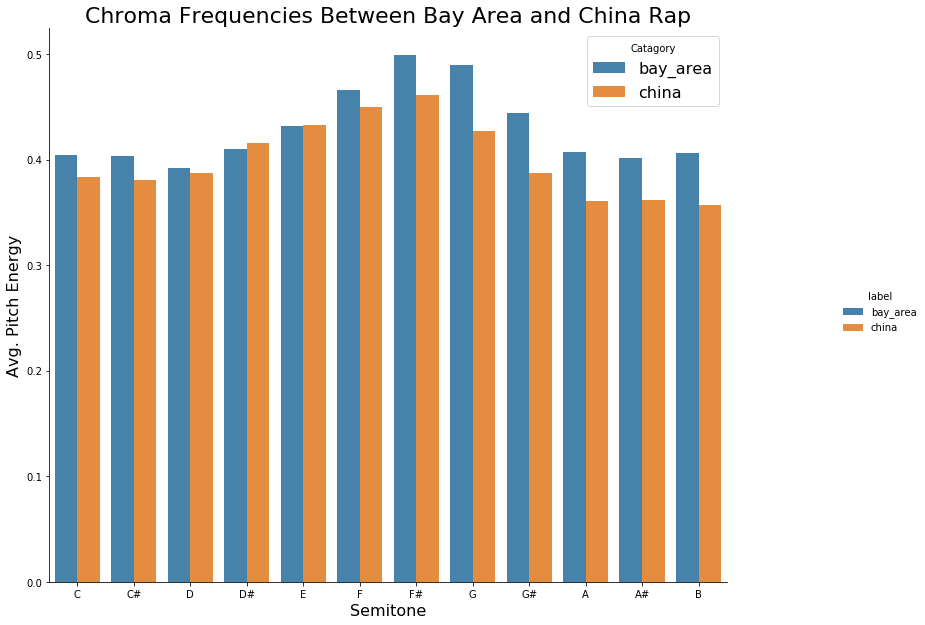

In [101]:
print(pitchInfo)

sns.catplot(x='semitone', y='value', hue='label', data=pitchInfo_melted, kind='bar', alpha=.9)
fig = plt.gcf()
fig.set_size_inches(14, 9)
plt.legend(prop={'size': 16}, title = 'Catagory')
plt.title('Chroma Frequencies Between Bay Area and China Rap', fontsize=22)
plt.xlabel('Semitones', fontsize=16)
plt.ylabel('Avg. Pitch Energy', fontsize=16)



# Model Creation (Audio Features)

In [23]:
def createModel(model, model_df, df_features):

    feature_cols = df_features
    X = feature_cols 
    y = model_df['label'] 

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20)
    clf = model
    fitted = clf.fit(X_train, y_train)
    pred = fitted.predict(X_test)
    accuracy = fitted.score(X_test, y_test)
    print('Accuracy:  ' + str(accuracy))
    f1 = f1_score(y_test, pred, average='weighted', labels=np.unique(pred))
    print('F1_score:  ' + str(f1))
    tn, fp, fn, tp = confusion_matrix(y_test, pred).ravel()
    print('tn: ' + str(tn) + '  |  fp: ' + str(fp) + '  |  fn: ' + str(fn) + '  |  tp: ' + str(tp))


In [5]:
def extract_features(f):
    y, _ = librosa.load(f)
    
    mfcc = librosa.feature.mfcc(y)
    mfcc /= np.amax(np.absolute(mfcc))
    
    return len(np.ndarray.flatten(mfcc))

In [6]:
def get_feat_labels():
    
    mfcc_feat = []
    labels = []
    
    songs_loc = [bay_area_files, chinese_files]
    label = ['bay_area', 'china']
    
    for i in range(len(songs_loc)):
        for file in songs_loc[i]:
            
            features = extract_features(file)
            mfcc_feat.append(features)
            labels.append(label[i])
        
    # One-Hot
    uniq_label_id, row_label_id = np.unique(labels, return_inverse=True)
    row_label_id = row_label_id.astype(np.int32, copy=False)
    onehot_labels = to_categorical(row_label_id, len(uniq_label_id))
    
    return np.stack(mfcc_feat), onehot_labels

In [7]:
%%capture [--no-stderr]
features, labels = get_feat_labels()

NameError: name 'to_catagorical' is not defined

In [ ]:
split = .8
data = np.column_stack((features, labels))
np.random.shuffle(data)
splitidx = int(len(data) * split)
train, test = data[:splitidx,:], data[splitidx:,:]

train_feat = train[:,:-10]

In [25]:
createModel(LinearSVC(), df, df[['chroma_stft', 'spec_cent', 'spec_bw', 'rolloff', 'zcr', 'mfcc_0', 'mfcc_1', 'mfcc_2', 'mfcc_3', 'mfcc_4', 'mfcc_5', 'mfcc_6', 'mfcc_7', 'mfcc_8', 'mfcc_9', 'mfcc_10', 'mfcc_11']])

Accuracy:  0.5196078431372549
F1_score:  0.39729732232997117
tn: 9  |  fp: 98  |  fn: 0  |  tp: 97


/opt/conda/lib/python3.7/site-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


In [26]:
createModel(MLPClassifier(), df, df[['chroma_stft', 'spec_cent', 'spec_bw', 'rolloff', 'zcr', 'mfcc_0', 'mfcc_1', 'mfcc_2', 'mfcc_3', 'mfcc_4', 'mfcc_5', 'mfcc_6', 'mfcc_7', 'mfcc_8', 'mfcc_9', 'mfcc_10', 'mfcc_11']])

Accuracy:  0.5882352941176471
F1_score:  0.5720588235294118
tn: 78  |  fp: 20  |  fn: 64  |  tp: 42


In [39]:
createModel(LogisticRegression(), df, df[['chroma_stft', 'spec_cent', 'spec_bw', 'rolloff', 'zcr', 'mfcc_0', 'mfcc_1', 'mfcc_2', 'mfcc_3', 'mfcc_4', 'mfcc_5', 'mfcc_6', 'mfcc_7', 'mfcc_8', 'mfcc_9', 'mfcc_10', 'mfcc_11']])

Accuracy:  0.75
F1_score:  0.7501263021146584
tn: 80  |  fp: 27  |  fn: 24  |  tp: 73


/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


In [40]:
createModel(RandomForestClassifier(), df, df[['chroma_stft', 'spec_cent', 'spec_bw', 'rolloff', 'zcr', 'mfcc_0', 'mfcc_1', 'mfcc_2', 'mfcc_3', 'mfcc_4', 'mfcc_5', 'mfcc_6', 'mfcc_7', 'mfcc_8', 'mfcc_9', 'mfcc_10', 'mfcc_11']])

Accuracy:  0.7450980392156863
F1_score:  0.7447054293415479
tn: 80  |  fp: 22  |  fn: 30  |  tp: 72


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
